<a href="https://colab.research.google.com/github/gongx030/etv2_pioneer/blob/master/Brg1KD_scRNA_seq_D0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analysis of single-cell RNA-seq data of Etv2 induced reprogramming

by Wuming Gong



In [ ]:
start_time0 <- Sys.time()

### Install R packages
A large fraction of the running time of this notebook is in installing the Seurat R package, since it has lots of dependencies and many of them use Rcpp which results in the need to compile lots of C++ code.

In [ ]:
if (!requireNamespace("BiocManager", quietly = TRUE))
  install.packages("BiocManager")
BiocManager::install(c('SummarizedExperiment', 'rhdf5', 'SingleCellExperiment'), Ncpus = 2)
install.packages(c('farver', "Seurat"), Ncpus = 2)
install.packages('devtools')
devtools::install_github('rstudio/reticulate')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Bioconductor version 3.11 (BiocManager 1.30.10), R 4.0.2 (2020-06-22)

Installing package(s) 'BiocVersion', 'SummarizedExperiment', 'rhdf5',
  'SingleCellExperiment'

also installing the dependencies ‘zlibbioc’, ‘bitops’, ‘XVector’, ‘matrixStats’, ‘RCurl’, ‘GenomeInfoDbData’, ‘GenomicRanges’, ‘Biobase’, ‘DelayedArray’, ‘BiocGenerics’, ‘S4Vectors’, ‘IRanges’, ‘GenomeInfoDb’, ‘Rhdf5lib’


Old packages: 'broom', 'foreign'

Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘gtools’, ‘caTools’, ‘sitmo’, ‘globals’, ‘listenv’, ‘plyr’, ‘zoo’, ‘hexbin’, ‘data.table’, ‘rappdirs’, ‘gplots’, ‘reshape2’, ‘gridExtra’, ‘httpuv’, ‘xtable’, ‘sourcetools’, ‘fastmap’, ‘spatstat.data’, ‘spatstat.utils’, ‘deldir’, ‘abind’, ‘tensor’, ‘polyclip’, ‘goftest’, ‘FNN’, ‘RSpectra’, ‘dqrng’, ‘cowplot’, ‘fitdistrplus’, ‘future’, ‘future.apply’, ‘ggrepel’, ‘ggridges’, ‘


✔  checking for file ‘/tmp/Rtmpnw08G6/remotes6e27418bdb/rstudio-reticulate-b1604eb/DESCRIPTION’
─  preparing ‘reticulate’:
✔  checking DESCRIPTION meta-information
─  cleaning src
─  checking for LF line-endings in source and make files and shell scripts
─  checking for empty or unneeded directories
─  building ‘reticulate_1.16-9001.tar.gz’
   


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



### Install Python packages

In [ ]:
system('pip3 install scvi-tools', intern = TRUE)
system('pip3 install anndata2ri', intern = TRUE)
system('pip3 install scanpy', intern = TRUE)

[1] "Collecting scvi-tools"                                                                                                                                                                                        
 [2] "  Downloading https://files.pythonhosted.org/packages/3f/e5/313aacd14ba8188422f19776a2399f0da4abea6c4c6fae15f3efece83085/scvi_tools-0.7.0b0-py3-none-any.whl (151kB)"                                         
 [3] "Collecting rich>=6.2.0"                                                                                                                                                                                       
 [4] "  Downloading https://files.pythonhosted.org/packages/c8/45/19d56f75647faf1966d7d5274a891fdb9007c27392184019b6e7dcd04d4b/rich-7.1.0-py3-none-any.whl (153kB)"                                                 
 [5] "Requirement already satisfied: numpy>=1.17.0 in /usr/local/lib/python3.6/dist-packages (from scvi-tools) (1.18.5)"                                                                                            
 [6] "Collecting importlib-metadata<2.0,>=1.0; python_version < \"3.8\""                                                                                                                                            
 [7] "  Downloading https://files.pythonhosted.org/packages/8e/58/cdea07eb51fc2b906db0968a94700866fc46249bdc75cac23f9d13168929/importlib_metadata-1.7.0-py2.py3-none-any.whl"                                       
 [8] "Requirement already satisfied: hyperopt==0.1.2 in /usr/local/lib/python3.6/dist-packages (from scvi-tools) (0.1.2)"                                                                                           
 [9] "Requirement already satisfied: numba>=0.41.0 in /usr/local/lib/python3.6/dist-packages (from scvi-tools) (0.48.0)"                                                                                            
[10] "Requirement already satisfied: torch>=1.3 in /usr/local/lib/python3.6/dist-packages (from scvi-tools) (1.6.0+cu101)"                                                                                          
[11] "Requirement already satisfied: tqdm>=4.31.1 in /usr/local/lib/python3.6/dist-packages (from scvi-tools) (4.41.1)"                                                                                             
[12] "Requirement already satisfied: ipywidgets in /usr/local/lib/python3.6/dist-packages (from scvi-tools) (7.5.1)"                                                                                                
[13] "Requirement already satisfied: h5py>=2.9.0 in /usr/local/lib/python3.6/dist-packages (from scvi-tools) (2.10.0)"                                                                                              
[14] "Collecting anndata>=0.7.4"                                                                                                                                                                                    
[15] "  Downloading https://files.pythonhosted.org/packages/93/20/a0ac7af93c9312da8ab1b440e26d8f6098670cf0a9c7cbe26a0d14456b67/anndata-0.7.4-py3-none-any.whl (118kB)"                                              
[16] "Requirement already satisfied: scikit-learn>=0.21.2 in /usr/local/lib/python3.6/dist-packages (from scvi-tools) (0.22.2.post1)"                                                                               
[17] "Collecting xlrd>=1.2.0"                                                                                                                                                                                       
[18] "  Downloading https://files.pythonhosted.org/packages/b0/16/63576a1a001752e34bf8ea62e367997530dc553b689356b9879339cf45a4/xlrd-1.2.0-py2.py3-none-any.whl (103kB)"                                             
[19] "Requirement already satisfied: pandas>=1.0 in /usr/local/lib/python3.6/dist-packages (from scvi-tools) (1.1.2)"                                                  

[1] "Collecting anndata2ri"                                                                                                                                                   
 [2] "  Downloading https://files.pythonhosted.org/packages/7a/9f/77d96cc12345fcab6bcb361d6df3e2583e075bc0414052220124261c9a50/anndata2ri-1.0.4-py3-none-any.whl"              
 [3] "Requirement already satisfied: tzlocal in /usr/local/lib/python3.6/dist-packages (from anndata2ri) (1.5.1)"                                                              
 [4] "Collecting get_version"                                                                                                                                                  
 [5] "  Downloading https://files.pythonhosted.org/packages/23/48/7610e884e62fff2183e7bc8592397c39a020267fb5147905fcd3f9cc820c/get_version-2.1-py3-none-any.whl (43kB)"        
 [6] "Requirement already satisfied: rpy2>=3.0.1 in /usr/local/lib/python3.6/dist-packages (from anndata2ri) (3.2.7)"                                                          
 [7] "Requirement already satisfied: anndata in /usr/local/lib/python3.6/dist-packages (from anndata2ri) (0.7.4)"                                                              
 [8] "Requirement already satisfied: pytz in /usr/local/lib/python3.6/dist-packages (from tzlocal->anndata2ri) (2018.9)"                                                       
 [9] "Requirement already satisfied: setuptools in /usr/local/lib/python3.6/dist-packages (from get_version->anndata2ri) (50.3.0)"                                             
[10] "Requirement already satisfied: simplegeneric in /usr/local/lib/python3.6/dist-packages (from rpy2>=3.0.1->anndata2ri) (0.8.1)"                                           
[11] "Requirement already satisfied: cffi>=1.13.1 in /usr/local/lib/python3.6/dist-packages (from rpy2>=3.0.1->anndata2ri) (1.14.3)"                                           
[12] "Requirement already satisfied: pytest in /usr/local/lib/python3.6/dist-packages (from rpy2>=3.0.1->anndata2ri) (3.6.4)"                                                  
[13] "Requirement already satisfied: jinja2 in /usr/local/lib/python3.6/dist-packages (from rpy2>=3.0.1->anndata2ri) (2.11.2)"                                                 
[14] "Requirement already satisfied: numpy>=1.15 in /usr/local/lib/python3.6/dist-packages (from anndata->anndata2ri) (1.18.5)"                                                
[15] "Requirement already satisfied: scipy~=1.0 in /usr/local/lib/python3.6/dist-packages (from anndata->anndata2ri) (1.4.1)"                                                  
[16] "Requirement already satisfied: h5py in /usr/local/lib/python3.6/dist-packages (from anndata->anndata2ri) (2.10.0)"                                                       
[17] "Requirement already satisfied: packaging in /usr/local/lib/python3.6/dist-packages (from anndata->anndata2ri) (20.4)"                                                    
[18] "Requirement already satisfied: natsort in /usr/local/lib/python3.6/dist-packages (from anndata->anndata2ri) (5.5.0)"                                                     
[19] "Requirement already satisfied: pandas>=1.0 in /usr/local/lib/python3.6/dist-packages (from anndata->anndata2ri) (1.1.2)"                                                 
[20] "Requirement already satisfied: importlib-metadata>=0.7; python_version < \"3.8\" in /usr/local/lib/python3.6/dist-packages (from anndata->anndata2ri) (1.7.0)"           
[21] "Requirement already satisfied: pycparser in /usr/local/lib/python3.6/dist-packages (from cffi>=1.13.1->rpy2>=3.0.1->anndata2ri) (2.20)"                                  
[22] "Requirement already satisfied: more-itertools>=4.0.0 in /usr/local/lib/python3.6/dist-packages (from pytest->rpy2>=3.0.1->anndata2ri) (8.5.0)"                           
[23] "Requirement already satisfied: pluggy<0.8,>=0.5 in /usr/local/lib/python3.6/dist-packages (from pytest->rpy2>=3.0.1->anndat

[1] "Collecting scanpy"                                                                                                                                                 
 [2] "  Downloading https://files.pythonhosted.org/packages/f1/5e/425ed9ddca83fac43eb328ebf1aa41e4cdcdc17c6d294495b34d9a243ddd/scanpy-1.6.0-py3-none-any.whl (7.7MB)"    
 [3] "Requirement already satisfied: tqdm in /usr/local/lib/python3.6/dist-packages (from scanpy) (4.41.1)"                                                              
 [4] "Requirement already satisfied: pandas>=0.21 in /usr/local/lib/python3.6/dist-packages (from scanpy) (1.1.2)"                                                       
 [5] "Collecting legacy-api-wrap"                                                                                                                                        
 [6] "  Downloading https://files.pythonhosted.org/packages/a4/68/da997bc56bb69dcdcee4054f0bc42266909307b905389fbc54c9158f42da/legacy_api_wrap-1.2-py3-none-any.whl"     
 [7] "Requirement already satisfied: statsmodels>=0.10.0rc2 in /usr/local/lib/python3.6/dist-packages (from scanpy) (0.10.2)"                                            
 [8] "Requirement already satisfied: joblib in /usr/local/lib/python3.6/dist-packages (from scanpy) (0.16.0)"                                                            
 [9] "Collecting setuptools-scm"                                                                                                                                         
[10] "  Downloading https://files.pythonhosted.org/packages/ad/d3/e54f8b4cde0f6fb4f231629f570c1a33ded18515411dee6df6fe363d976f/setuptools_scm-4.1.2-py2.py3-none-any.whl"
[11] "Requirement already satisfied: umap-learn>=0.3.10 in /usr/local/lib/python3.6/dist-packages (from scanpy) (0.4.6)"                                                 
[12] "Requirement already satisfied: matplotlib>=3.1.2 in /usr/local/lib/python3.6/dist-packages (from scanpy) (3.2.2)"                                                  
[13] "Requirement already satisfied: anndata>=0.7 in /usr/local/lib/python3.6/dist-packages (from scanpy) (0.7.4)"                                                       
[14] "Requirement already satisfied: numba>=0.41.0 in /usr/local/lib/python3.6/dist-packages (from scanpy) (0.48.0)"                                                     
[15] "Requirement already satisfied: patsy in /usr/local/lib/python3.6/dist-packages (from scanpy) (0.5.1)"                                                              
[16] "Requirement already satisfied: natsort in /usr/local/lib/python3.6/dist-packages (from scanpy) (5.5.0)"                                                            
[17] "Requirement already satisfied: tables in /usr/local/lib/python3.6/dist-packages (from scanpy) (3.4.4)"                                                             
[18] "Requirement already satisfied: importlib-metadata>=0.7; python_version < \"3.8\" in /usr/local/lib/python3.6/dist-packages (from scanpy) (1.7.0)"                  
[19] "Requirement already satisfied: scipy>=1.4 in /usr/local/lib/python3.6/dist-packages (from scanpy) (1.4.1)"                                                         
[20] "Requirement already satisfied: networkx>=2.3 in /usr/local/lib/python3.6/dist-packages (from scanpy) (2.5)"                                                        
[21] "Requirement already satisfied: numpy>=1.17.0 in /usr/local/lib/python3.6/dist-packages (from scanpy) (1.18.5)"                                                     
[22] "Collecting sinfo"                                                                                                                                                  
[23] "  Downloading https://files.pythonhosted.org/packages/e1/4c/aef8456284f1a1c3645b938d9ca72388c9c4878e6e67b8a349c7d22fac78/sinfo-0.3.1.tar.gz"                       
[24] "Requirement already satisfied: h5py>=2.10.0 in /usr/local/lib/python3.6/dist-packages

#### Load the python packages within R by `reticulate`

In [ ]:
library(reticulate)
py_config()
scvi <- import('scvi')
anndata2ri <- import('anndata2ri')
anndata <- import('anndata')
sc <- import('scanpy')
torch <- import('torch')
np <- import('numpy')

python:         /usr/bin/python3
libpython:      /usr/lib/python3.6/config-3.6m-x86_64-linux-gnu/libpython3.6.so
pythonhome:     //usr://usr
version:        3.6.9 (default, Jul 17 2020, 12:50:27)  [GCC 8.4.0]
numpy:          /usr/local/lib/python3.6/dist-packages/numpy
numpy_version:  1.18.5

python versions found: 
 /usr/bin/python3
 /usr/bin/python
 /usr/local/bin/python

## Copy the processed the scRNA-seq data to S3 storage and make them public.
These are the bash scripts executed at UMN MSI.

```
s3cmd sync --no-check-md5 --exclude '*.bam' \
/home/garrydj/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_079/Analysis/ \
s3://gongx030/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_079/Analysis/
 
s3cmd setacl -P -r s3://gongx030/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_079/Analysis/
 
s3cmd sync --no-check-md5 --exclude '*.bam' \
/home/garrydj/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_080/Analysis/ \
s3://gongx030/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_080/Analysis/
 
s3cmd setacl -P -r s3://gongx030/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_080/Analysis/
 
s3cmd sync --no-check-md5 --exclude '*.bam' \
/home/garrydj/data_release/umgc/novaseq/190319_A00223_0092_BH73WLDRXX/Garry_Project_063/Analysis/ \
s3://gongx030/data_release/umgc/novaseq/190319_A00223_0092_BH73WLDRXX/Garry_Project_063/Analysis/
 
s3cmd setacl -P -r s3://gongx030/data_release/umgc/novaseq/190319_A00223_0092_BH73WLDRXX/Garry_Project_063/Analysis/
 
s3cmd sync --no-check-md5 --exclude '*.bam' \
/home/garrydj/data_release/umgc/novaseq/190319_A00223_0092_BH73WLDRXX/Garry_Project_065/Analysis/ \
s3://gongx030/data_release/umgc/novaseq/190319_A00223_0092_BH73WLDRXX/Garry_Project_065/Analysis/
 
s3cmd setacl -P -r s3://gongx030/data_release/umgc/novaseq/190319_A00223_0092_BH73WLDRXX/Garry_Project_065/Analysis/
 
s3cmd sync --no-check-md5 --exclude '*.bam' \
 /home/garrydj/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_063/Analysis/ \
s3://gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_063/Analysis/
 
s3cmd setacl -P -r s3://gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_063/Analysis/
 
s3cmd sync --no-check-md5 --exclude '*.bam' \
 /home/garrydj/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_064/Analysis/ \
s3://gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_064/Analysis/
 
s3cmd setacl -P -r s3://gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_064/Analysis/
 
s3cmd sync --no-check-md5 --exclude '*.bam' \
/home/garrydj/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_065/Analysis/ \
s3://gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_065/Analysis/
 
s3cmd setacl -P -r s3://gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_065/Analysis/
```

In [ ]:
library(Seurat)
library(rhdf5)
library(Matrix)
library(SummarizedExperiment)
library(SingleCellExperiment)
library(tidyverse)
library(farver)
library(scales) # hue_pal
theme_set(theme_bw())

#library(DropletUtils)
#library(scico)

Registered S3 method overwritten by 'spatstat':
  method     from
  print.boxx cli 

Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following object is masked from ‘package:Matrix’:

    which


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rb

In [ ]:
dirs <- c(
  'MEF_Dox_D1' = 'https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/190319_A00223_0092_BH73WLDRXX/Garry_Project_063/Analysis/cellranger-Garry_Project_063_NoDOX',
  'MEF_NoDox' = 'https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_063/Analysis/cellranger-Garry_Project_063_DOX-combined',
  'MEF_Dox_D2' = 'https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_064/Analysis/cellranger-Garry_Project_064_DOX_Day2-combined',
  'MEF_Dox_D7' = 'https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_065/Analysis/cellranger-Garry_065_01-combined',
  'MEF_Dox_D7_Flk1pos' = 'https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/190319_A00223_0092_BH73WLDRXX/Garry_Project_065/Analysis/cellranger-Garry_065_02',
  'MEF_Brg1_KD_Dox_D1'= 'https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_079/Analysis/cellranger-Garry_079_D1_DOX_FL',
  'MEF_Brg1_KD_D0' = 'https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_079/Analysis/cellranger-Garry_079_D0_KO_FL',
#  'MEF_Brg1_KD_Dox_D2' = 'https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_079/Analysis/cellranger-Garry_079_D2_DOX_FL',
  'MEF_Brg1_KD_Dox_D7' = 'https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_080/Analysis/cellranger-Garry_080_D7_DOX_FL',
  'MEF_Brg1_KD_NoDox_D7' = 'https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/200825_A00223_0395_BH3H2HDSXY/Garry_Project_080/Analysis/cellranger-Garry_080_D7_NODOX_FL'
)

## Download the barcode files

In [ ]:
barcode_files <- sprintf('%s/filtered_feature_bc_matrix.h5', dirs)
cat('remote filtered_feature_bc_matrix files:\n')
print(barcode_files)
local_barcode_files <- gsub('https://s3.msi.umn.edu/', './', barcode_files)
cat('local filtered_feature_bc_matrix files:\n')
print(local_barcode_files)
commands <- sprintf('wget -x -c -nH %s', barcode_files)
for (command in commands) system(command)
file.exists(local_barcode_files)

remote filtered_feature_bc_matrix files:
[1] "https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/190319_A00223_0092_BH73WLDRXX/Garry_Project_063/Analysis/cellranger-Garry_Project_063_NoDOX/filtered_feature_bc_matrix.h5"            
[2] "https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_063/Analysis/cellranger-Garry_Project_063_DOX-combined/filtered_feature_bc_matrix.h5"     
[3] "https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_064/Analysis/cellranger-Garry_Project_064_DOX_Day2-combined/filtered_feature_bc_matrix.h5"
[4] "https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/190401_A00223_0099_BH5WJCDRXX/Garry_Project_065/Analysis/cellranger-Garry_065_01-combined/filtered_feature_bc_matrix.h5"              
[5] "https://s3.msi.umn.edu/gongx030/data_release/umgc/novaseq/190319_A00223_0092_BH73WLDRXX/Garry_Project_065/Analysis/cellranger-Garry_065_02/filtered_feature_bc_mat

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

## Read the raw read count matrix

In [ ]:
so <- lapply(1:length(local_barcode_files), function(i){ 
  barcodes <- h5read(local_barcode_files[i], 'matrix/barcodes')
  data <- h5read(local_barcode_files[i], 'matrix/data')
  shape <- h5read(local_barcode_files[i], 'matrix/shape')
  indices <- h5read(local_barcode_files[i], 'matrix/indices')
  indptr <- h5read(local_barcode_files[i], 'matrix/indptr')
  feature_type <- as.character(h5read(local_barcode_files[i], 'matrix/features/feature_type'))
  genome <- as.character(h5read(local_barcode_files[i], 'matrix/features/genome'))
  id <- as.character(h5read(local_barcode_files[i], 'matrix/features/id'))
  name <- as.character(h5read(local_barcode_files[i], 'matrix/features/name'))
  sparseMatrix(i = indices + 1, j = rep(1:shape[2], diff(indptr)), x = data, dims = shape, dimnames = list(name, barcodes))
})
names(so) <- names(dirs)

In [ ]:
for (i in 1:length(so)){
  cat(sprintf('condition=%s | number of features=%d | number of cells=%d\n', names(so)[i], nrow(so[[i]]), ncol(so[[i]])))
}

condition=MEF_Dox_D1 | number of features=31053 | number of cells=1207
condition=MEF_NoDox | number of features=31053 | number of cells=4353
condition=MEF_Dox_D2 | number of features=31053 | number of cells=3966
condition=MEF_Dox_D7 | number of features=31053 | number of cells=8922
condition=MEF_Dox_D7_Flk1pos | number of features=31053 | number of cells=1506
condition=MEF_Brg1_KD_Dox_D1 | number of features=31053 | number of cells=7508
condition=MEF_Brg1_KD_D0 | number of features=31053 | number of cells=7974
condition=MEF_Brg1_KD_Dox_D7 | number of features=31053 | number of cells=8518
condition=MEF_Brg1_KD_NoDox_D7 | number of features=31053 | number of cells=8601


In [ ]:
so <- lapply(names(so), function(i) {
  X <- so[[i]]
  X <- X[order(rowSums(X), decreasing = TRUE), ]
  X <- X[!duplicated(rownames(X)), ] # remove duplicated rownames
  y <- CreateSeuratObject(counts = X, min.cells = 3, min.features = 200, project = i)
  y[["percent.mt"]] <- PercentageFeatureSet(y, pattern = "^mt-")
  y[["percent.rpl"]] <- PercentageFeatureSet(y, pattern = "^Rpl")
  y[["percent.rps"]] <- PercentageFeatureSet(y, pattern = "^Rps")
  y
})
names(so) <- names(dirs)

In [ ]:
ps <- lapply(1:length(so), function(i) VlnPlot(so[[i]], c("nCount_RNA", "nFeature_RNA", 'percent.mt', 'percent.rpl', 'percent.rps'), pt.size = 0.1, ncol = 5))

We used patchwork to combine multiple figures made by ggplot2 (e.g. https://cmdlinetips.com/2020/01/tips-to-combine-multiple-ggplots-using-patchwork/)

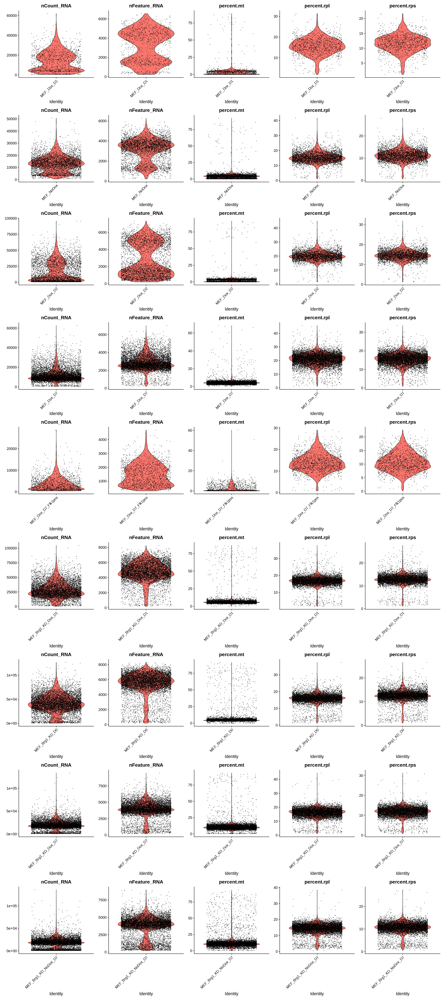

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 5 * length(ps))
Reduce('/', ps)

In [ ]:
for (i in 1:length(so)){
  so_i <- subset(so[[i]], nFeature_RNA > 200 & percent.mt < 20)
  cat(sprintf('%s | number of cels=%d | number of cells after filtering=%d | percent remaining cells=%3.f%%\n', names(so)[i], ncol(so[[i]]), ncol(so_i), ncol(so_i) / ncol(so[[i]]) * 100))
  so[[i]] <- so_i
}
names(so) <- names(dirs)

MEF_Dox_D1 | number of cels=1190 | number of cells after filtering=1154 | percent remaining cells= 97%
MEF_NoDox | number of cels=4188 | number of cells after filtering=4129 | percent remaining cells= 99%
MEF_Dox_D2 | number of cels=3940 | number of cells after filtering=3899 | percent remaining cells= 99%
MEF_Dox_D7 | number of cels=8890 | number of cells after filtering=8838 | percent remaining cells= 99%
MEF_Dox_D7_Flk1pos | number of cels=1505 | number of cells after filtering=1502 | percent remaining cells=100%
MEF_Brg1_KD_Dox_D1 | number of cels=7492 | number of cells after filtering=7351 | percent remaining cells= 98%
MEF_Brg1_KD_D0 | number of cels=7967 | number of cells after filtering=7713 | percent remaining cells= 97%
MEF_Brg1_KD_Dox_D7 | number of cels=8486 | number of cells after filtering=8248 | percent remaining cells= 97%
MEF_Brg1_KD_NoDox_D7 | number of cels=8556 | number of cells after filtering=8034 | percent remaining cells= 94%


## Analysis of D0 single cells

In [ ]:
# Merge multiple Seurat objects
conditions <- c('MEF_NoDox', 'MEF_Brg1_KD_D0')
so_merge <- merge(so[['MEF_NoDox']], so[['MEF_Brg1_KD_D0']], add.cell.ids = conditions, project = 'D0')

In [ ]:
cat(sprintf('number of total features=%d | number of total cells=%d\n', nrow(so_merge), ncol(so_merge)))

number of total features=18070 | number of total cells=11842


In [ ]:
table(so_merge$orig.ident)


MEF_Brg1_KD_D0      MEF_NoDox 
          7713           4129 

### Preprocess the raw read counts by `Seurat`.

In [ ]:
so_merge <- so_merge %>%
  NormalizeData() %>%
  ScaleData()

Centering and scaling data matrix



Select top variable genes.

In [ ]:
so_merge <- FindVariableFeatures(so_merge, selection.method = 'vst')

See how number of total counts and number of genes expressed are distributed.

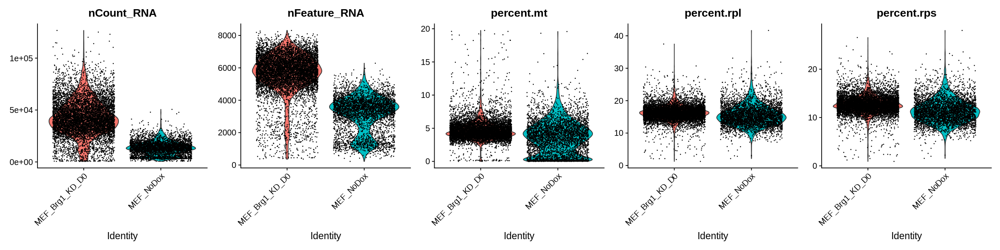

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 5)
VlnPlot(so_merge, c("nCount_RNA", "nFeature_RNA", 'percent.mt', 'percent.rpl', 'percent.rps'), pt.size = 0.1, ncol = 5)

### Examine the expression of Etv2 and Brg1 in `MEF_NoDox` and `MEF_Brg1_KD_D0`

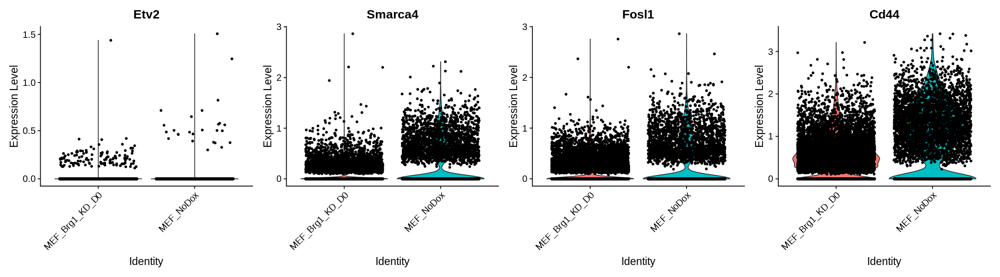

In [ ]:
genes <- c('Etv2', 'Smarca4', 'Fosl1', 'Cd44')
options(repr.plot.width = 18, repr.plot.height = 5)
VlnPlot(so_merge, features = genes, ncol = 4)

It looks like Smarca4 (Brg1) is significantly up-regulated in the control MEF (`MEF_NoDox`), even though there is still considerably expressions in Brg1 KD samples (`MEF_Brg1_KD_D0`). 

### Cell cycle scoring analysis of D0 cells
Follows https://satijalab.org/seurat/v3.2/cell_cycle_vignette.html

In [ ]:
# A list of cell cycle markers, from Tirosh et al, 2015, is loaded with Seurat.  We can
# segregate this list into markers of G2/M phase and markers of S phase
s.genes <- cc.genes$s.genes
g2m.genes <- cc.genes$g2m.genes
substring(s.genes, 2) <- tolower(substring(s.genes, 2))
substring(g2m.genes, 2) <- tolower(substring(g2m.genes, 2))

In [ ]:
so_merge <- CellCycleScoring(so_merge, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)
# view cell cycle scores and phase assignments
head(so_merge[[]])

Warning message:
“The following features are not present in the object: Mlf1ip, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Fam64a, Hn1, not searching for symbol synonyms”


,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rpl,percent.rps,S.Score,G2M.Score,Phase,old.ident
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
MEF_NoDox_AAACCTGAGGATGTAT-1,MEF_NoDox,24881,4690,3.2916683,15.04763,11.989068,0.084570281,0.26352659,G2M,MEF_NoDox
MEF_NoDox_AAACCTGAGGCTCAGA-1,MEF_NoDox,15159,2607,0.2572729,17.19111,12.500825,0.275748051,0.03953106,S,MEF_NoDox
MEF_NoDox_AAACCTGAGGCTCATT-1,MEF_NoDox,31508,4779,3.8879015,13.66320,10.397359,0.010607636,0.19866022,G2M,MEF_NoDox
MEF_NoDox_AAACCTGAGTTGTCGT-1,MEF_NoDox,15236,3609,3.9708585,14.38041,11.118404,0.158661767,-0.21515967,S,MEF_NoDox
MEF_NoDox_AAACCTGCACACTGCG-1,MEF_NoDox,24604,5072,3.4140790,11.59161,8.165339,-0.103171105,-0.15561545,G1,MEF_NoDox
MEF_NoDox_AAACCTGCAGTATCTG-1,MEF_NoDox,9446,2700,6.7753546,16.47258,12.629685,-0.009760229,-0.22054985,G1,MEF_NoDox


In [ ]:
so_merge <- RunPCA(so_merge, features = VariableFeatures(so_merge))

PC_ 1 
Positive:  Gm10076, Ifitm3, Rpsa, Rpl30, Ptms, Rpl28, Rps10, Gapdh, Scand1, Npc2 
	   Tgfbi, Gabarap, Rps21, Uba52, Rpl18, Rps24, Mt1, Ptn, Rps20, mt-Nd3 
	   Tecr, Mgp, Dcxr, Pgls, Ecm1, Col6a2, mt-Nd4l, Fdps, Gm10073, Vim 
Negative:  Rps27rt, Gm2000, AC160336.1, Snhg6, Uchl3, Tmsb4x, Usp50, Cavin2, Lyar, Fez2 
	   Hmga2, Emp1, Hmga1b, H3f3b, Tnfrsf12a, Serpine1, Cbx3, Plaur, Fhl1, Thbs1 
	   Tubb6, Timm8a1, Pclaf, Crim1, Tipin, Tceal9, Ptgs2, Cyr61, Hmga1, 3110039M20Rik 
PC_ 2 
Positive:  Mxd4, Hist1h2bc, Gsto1, Dkk3, Pdcd4, Mxra8, Snhg18, Col5a1, Neat1, Lgals3 
	   S100a4, Tmsb4x, Rnase4, Adam23, Thbs2, Trp53inp2, Pbxip1, Selenom, Gns, Grina 
	   Svep1, Cpxm1, Smim1, Tcn2, Emilin2, Col4a2, Ckb, Itgb5, Fbn1, Cryab 
Negative:  Hmgb2, Birc5, Mki67, Smc2, Smc4, Ccna2, Top2a, Cdk1, Ube2c, Tpx2 
	   Cenpe, Pclaf, Tuba1b, Lsm2, Racgap1, H2afz, Hist1h2ap, Dek, Hmmr, Kif20b 
	   Cdca8, Spc25, Tubb4b, Sgo2a, Ccnb1, Prc1, Sgo1, Tubb5, Incenp, Cenpf 
PC_ 3 
Positive:  Fn1, Fbln2, Col1a1,

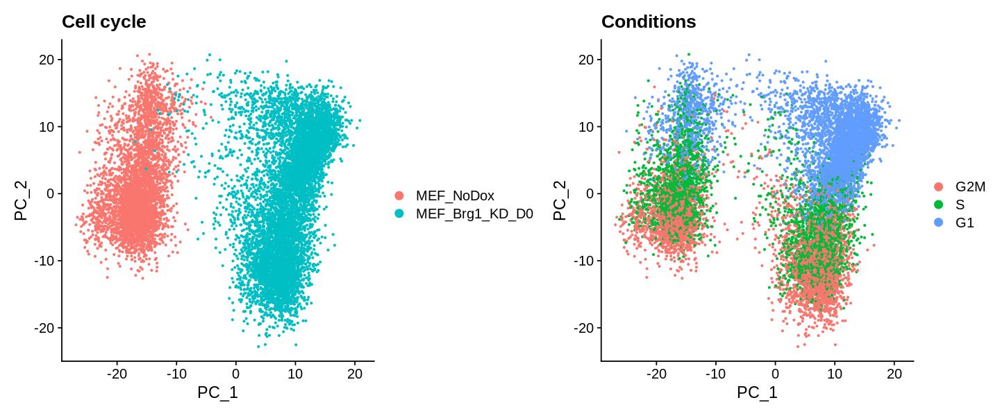

In [ ]:
options(repr.plot.width = 12, repr.plot.height = 5)
Idents(so_merge) <- 'orig.ident'
p1 <- DimPlot(so_merge, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Cell cycle")
Idents(so_merge) <- 'Phase'
p2 <- DimPlot(so_merge, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Conditions")
p1 + p2

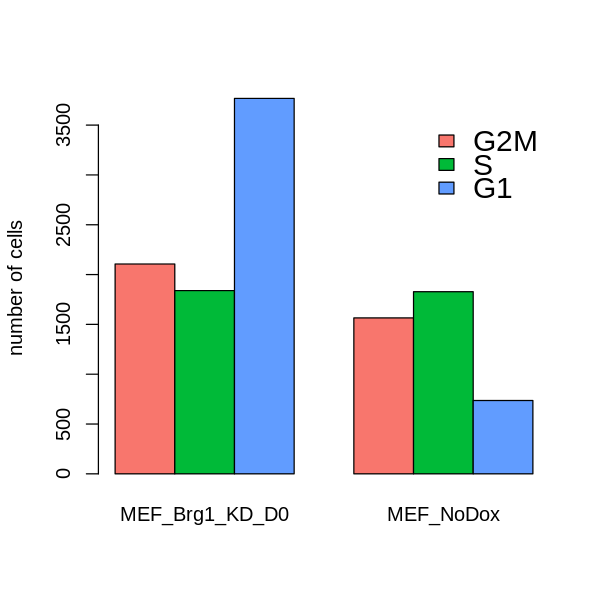

In [ ]:
options(repr.plot.width = 5, repr.plot.height = 5)
table(so_merge[[]][, 'orig.ident'], factor(so_merge[[]][, 'Phase'], c('G2M', 'S', 'G1'))) %>% 
  t() %>%
  barplot(beside = TRUE, col = hue_pal()(3), ylab = 'number of cells')
legend('topright', c('G2M', 'S', 'G1'), fill = hue_pal()(3), bty = 'n', cex = 1.5, inset = 0.05)

There are a lot of more G1 cells in `MEF_Brg1_KD_D0` samples

Picking joint bandwidth of 0.0591

Picking joint bandwidth of 0.0874

Picking joint bandwidth of 0.0629

Picking joint bandwidth of 0.06



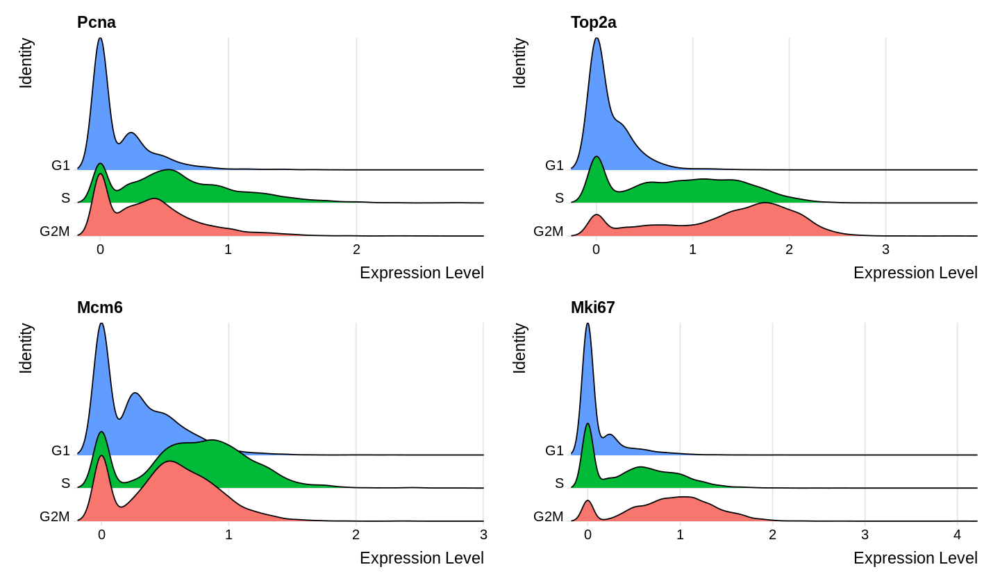

In [ ]:
# Visualize the distribution of cell cycle markers across
options(repr.plot.width = 12, repr.plot.height = 7)
RidgePlot(so_merge, features = c("Pcna", "Top2a", "Mcm6", "Mki67"), ncol = 2)

### Regress out the effect of cell cycle score, number of RNAs, percent of mitochondria/ribosome and cell cycle

In [ ]:
so_merge <- ScaleData(object = so_merge, vars.to.regress = c('nCount_RNA', "nFeature_RNA", 'percent.mt', 'percent.rpl', 'percent.rps', "S.Score", "G2M.Score"))

Regressing out nCount_RNA, nFeature_RNA, percent.mt, percent.rpl, percent.rps, S.Score, G2M.Score

Centering and scaling data matrix



In [ ]:
so_merge <- FindVariableFeatures(so_merge, selection.method = 'vst', nfeatures = 2000)
so_merge <- RunPCA(so_merge, features = VariableFeatures(so_merge))

PC_ 1 
Positive:  Gapdh, Rpsa, Ifitm3, Rpl30, Rpl18, Gm10076, Rps10, Rpl28, Ptms, Tspo 
	   Prdx2, Fdps, Atp5h, Rpl8, Ptn, Tecr, Psmb5, Col6a2, Tgfbi, Eef1d 
	   Uba52, Pcolce, Pgls, S100a6, Npc2, Atp5d, Scand1, Gas1, Col6a1, Rps24 
Negative:  Hmga2, AC160336.1, Emp1, Ptgs2, Thbs1, Cd44, Crim1, Rps27rt, Serpine1, Gm2000 
	   Amotl2, Cavin2, Cyr61, Tmsb4x, Inhba, Snhg6, Tnfrsf12a, Klf6, Odc1, Fez2 
	   Itgav, Jade1, Hbegf, Ctgf, Tnc, Mapk6, Ncam1, Tmcc3, Cdh2, F2r 
PC_ 2 
Positive:  Npm1, Hmgb1, Mpp6, Ncl, Prdx1, H2afz, Phb2, Hspd1, Ldha, H3f3b 
	   Tm4sf1, Prl2c2, C1qbp, Ddx39, Ppid, Pttg1, Timm8a1, Uchl3, Fkbp4, Pa2g4 
	   Cd9, Lyar, Fabp4, Snrpa1, Srsf3, 3110039M20Rik, Pclaf, Hmgb3, Cenpa, Srm 
Negative:  Col5a1, Fbln5, Fbn1, Cyp1b1, Itgb5, Col1a1, Dkk3, Scd2, Npnt, Col4a2 
	   Cxcl12, Lox, Svep1, Meg3, Sfrp1, Itgav, Sulf1, B4galt1, Adamtsl3, Fn1 
	   Pde8b, Tenm3, Pbxip1, Ctsd, Myl9, Adam23, Scd1, Gns, Cd248, Slc1a3 
PC_ 3 
Positive:  Col6a1, Col6a2, Il1rn, Aebp1, Plpp3, Fabp4, Far1

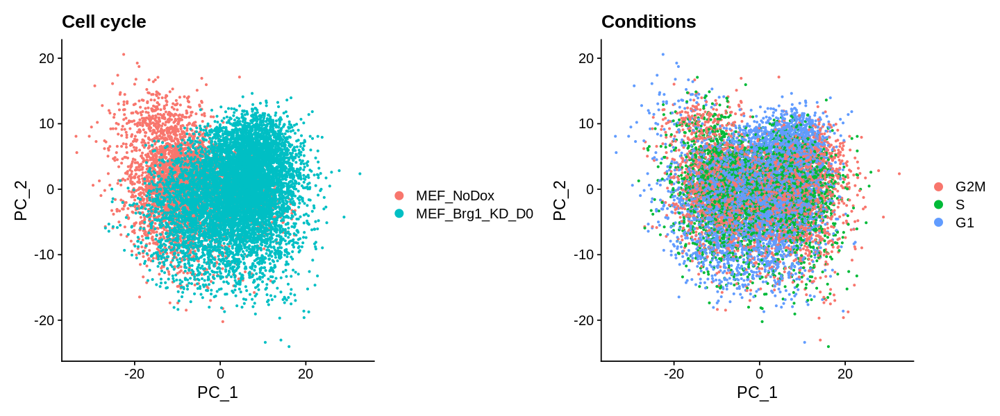

In [ ]:
options(repr.plot.width = 12, repr.plot.height = 5)
Idents(so_merge) <- 'orig.ident'
p1 <- DimPlot(so_merge, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Cell cycle")
Idents(so_merge) <- 'Phase'
p2 <- DimPlot(so_merge, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Conditions")
p1 + p2

### Dimension reduction

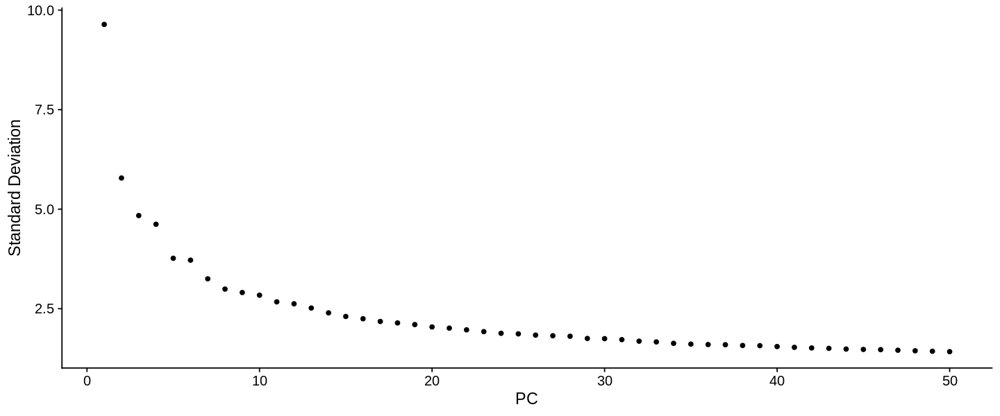

In [ ]:
ElbowPlot(so_merge, ndims = 50)

In [ ]:
so_merge <- RunUMAP(so_merge, reduction = 'pca', dims = 1:10, min.dist = 0.75, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


In [ ]:
# Leiden clustering
so_merge <- FindNeighbors(so_merge, reduction = 'umap', dims = 1:2)
so_merge <- FindClusters(so_merge, resolution = 0.15)
# store the current identities in a new column of meta.data called cluster
so_merge$cluster <- Idents(so_merge)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11842
Number of edges: 265614

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9626
Number of communities: 11
Elapsed time: 0 seconds


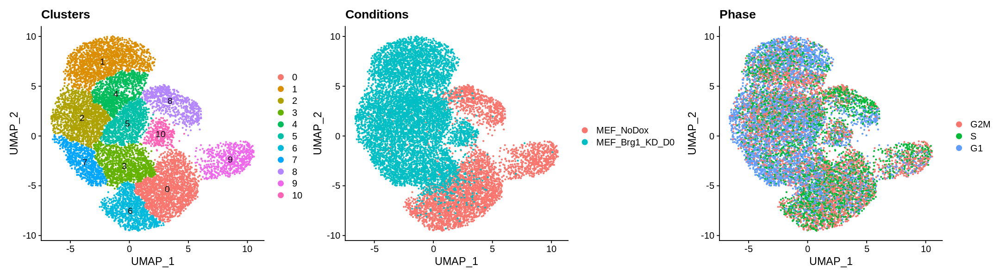

In [ ]:
library(ggplot2)
options(repr.plot.width = 18, repr.plot.height = 5)
Idents(so_merge) <- 'cluster'
p1 <- DimPlot(so_merge, reduction = "umap", pt.size = 0.5, label = TRUE) + ggtitle(label = "Clusters")
Idents(so_merge) <- 'orig.ident'
p2 <- DimPlot(so_merge, reduction = "umap", pt.size = 0.5) + ggtitle(label = "Conditions")
Idents(so_merge) <- 'Phase'
p3 <- DimPlot(so_merge, reduction = "umap", pt.size = 0.5) + ggtitle(label = "Phase")
p1 + p2 + p3

In [ ]:
genes <- c('Etv2', 'Smarca4', 'Fosl1', 'Cd44')

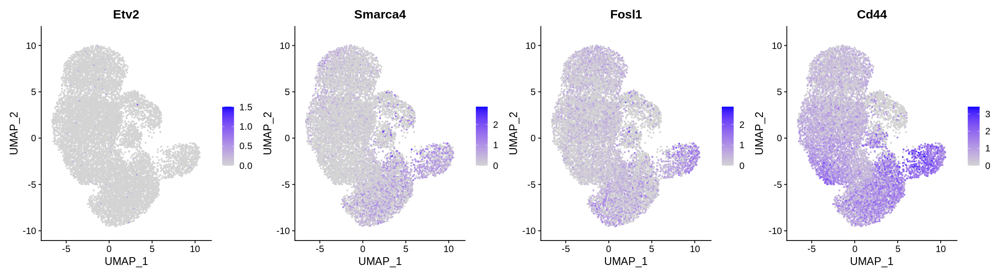

In [ ]:
options(repr.plot.width = 18, repr.plot.height = 5)
FeaturePlot(so_merge, dims = c(1, 2), features = genes, pt.size = 0.5, cols = c('lightgrey', 'blue'), ncol = 4)

### scVI based dimension reduction analysis

It appears that `scVI` does not offer additional benefit of visualizing the cells

#### Convert `SeuratObject` to `AnnData`.
Convert the  `SeuratObject` to a `SingleCellExperiment` then to an `AnnoData` used by `scVI`.
Adopted from https://github.com/theislab/zellkonverter/blob/master/R/konverter.R

We only include top 1,000 most variable genes to accelerate scVI training.


In [ ]:
sce <- as.SingleCellExperiment(so_merge)
sce <- sce[VariableFeatures(so_merge), ]
X <- t(assay(sce, 'counts'))
adata <- anndata$AnnData(X = X)
col_data <- colData(sce)
adata$obs <- do.call('data.frame', c(             
  as.list(col_data),
  check.names      = FALSE,
  stringsAsFactors = FALSE
))
adata$layers <- list(counts = X)
adata$obs$batch <- as.numeric(factor(colData(sce)$orig.ident))

In [ ]:
sc$pp$normalize_total(adata, target_sum = 1e4)
sc$pp$log1p(adata)
adata$raw <- adata

#### Train scVI model for dimension reduction


In [ ]:
start_time <- Sys.time()
scvi$settings$seed <- 123L
scvi$data$setup_anndata(adata, layer = "counts")
vae <- scvi$model$SCVI(adata, use_cuda = TRUE)
vae$train(n_epochs = 200L, n_epochs_kl_warmup = 50L)
Sys.time() - start_time

Time difference of 3.164576 mins

Add the scVI's latent representation to the Seurat object.  This representation will be used for clustering and UMAP.

In [ ]:
z <- vae$get_latent_representation()
rownames(z) <- colnames(so_merge)
so_merge[['scvi']] <- CreateDimReducObject(embeddings = z, key = "scVI_",  assay = DefaultAssay(so_merge))

Warning message:
“No columnames present in cell embeddings, setting to 'scVI_1:10'”


#### The neighborhood graph

In [ ]:
# Leiden clustering
so_merge <- FindNeighbors(so_merge, reduction = 'scvi', dims = 1:10)
so_merge <- FindClusters(so_merge, algorithm = 3, resolution = 0.4)
# store the current identities in a new column of meta.data called cluster
so_merge$cluster_scvi <- Idents(so_merge)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11842
Number of edges: 363828

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.9051
Number of communities: 12
Elapsed time: 6 seconds


#### UMAP

In [ ]:
so_merge <- RunUMAP(so_merge, reduction = 'scvi', dims = 1:10, min.dist = 0.75, verbose = FALSE)

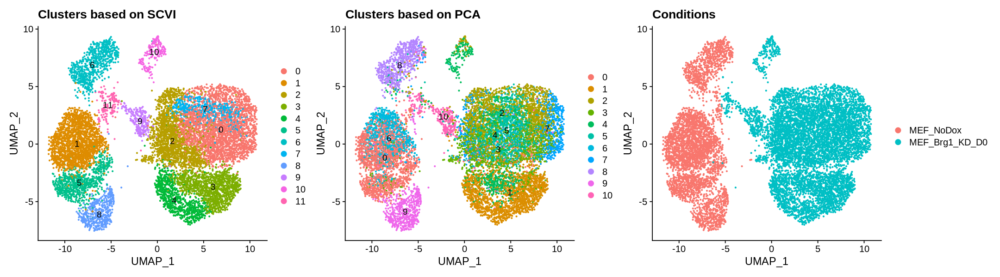

In [ ]:
library(ggplot2)
options(repr.plot.width = 18, repr.plot.height = 5)
Idents(so_merge) <- 'cluster_scvi'
p1 <- DimPlot(so_merge, reduction = "umap", pt.size = 0.5, label = TRUE) + ggtitle(label = "Clusters based on SCVI")
Idents(so_merge) <- 'cluster'
p2 <- DimPlot(so_merge, reduction = "umap", pt.size = 0.5, label = TRUE) + ggtitle(label = "Clusters based on PCA")
Idents(so_merge) <- 'orig.ident'
p3 <- DimPlot(so_merge, reduction = "umap", pt.size = 0.5) + ggtitle(label = "Conditions")
p1 + p2 + p3

`MEF_NoDox` and `MEF_Brg1_KD_D0` form two very distinct populations, suggesting their global expression patterns are very different.

In [ ]:
genes <- c('Etv2', 'Smarca4', 'Fosl1', 'Cd44')

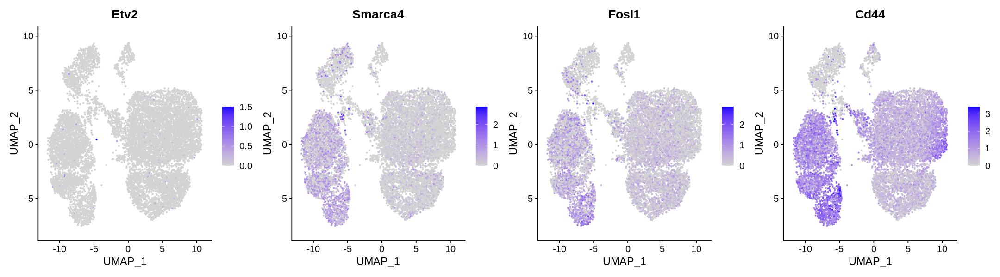

In [ ]:
options(repr.plot.width = 18, repr.plot.height = 5)
FeaturePlot(so_merge, dims = c(1, 2), features = genes, pt.size = 0.5, cols = c('lightgrey', 'blue'), ncol = 4)

#### Finding differentially expressed genes between `MEF_NoDOX` and `MEF_Brg1_KD_D0`.

In [ ]:
Idents(so_merge) <- 'orig.ident'
so_markers <- FindAllMarkers(so_merge, test.use = "wilcox",, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster MEF_NoDox

For a more efficient implementation of the Wilcoxon Rank Sum Test,
(default method for FindMarkers) please install the limma package
--------------------------------------------
install.packages('BiocManager')
BiocManager::install('limma')
--------------------------------------------
After installation of limma, Seurat will automatically use the more 
efficient implementation (no further action necessary).
This message will be shown once per session

Calculating cluster MEF_Brg1_KD_D0



In [ ]:
so_markers %>%
  group_by(cluster) %>% 
  top_n(n = 20, wt = avg_logFC) %>%
  print(n = 10000)

# A tibble: 40 x 7
# Groups:   cluster [2]
       p_val avg_logFC pct.1 pct.2 p_val_adj cluster        gene      
       <dbl>     <dbl> <dbl> <dbl>     <dbl> <fct>          <chr>     
 1 0.             1.87 0.773 0.634 0.        MEF_NoDox      Thbs1     
 2 0.             1.72 0.999 0.991 0.        MEF_NoDox      Pfn1      
 3 0.             1.50 0.716 0.2   0.        MEF_NoDox      AC160336.1
 4 0.             1.49 0.999 0.994 0.        MEF_NoDox      Rpl23a    
 5 0.             1.41 0.992 0.981 0.        MEF_NoDox      Usmg5     
 6 0.             1.26 0.998 0.997 0.        MEF_NoDox      Ftl1-ps1  
 7 0.             1.25 0.998 0.995 0.        MEF_NoDox      Rps6      
 8 0.             1.25 0.956 0.87  0.        MEF_NoDox      Hypk      
 9 0.             1.22 0.917 0.52  0.        MEF_NoDox      Rps27rt   
10 0.             1.22 0.996 0.992 0.        MEF_NoDox      Rpl22l1   
11 0.             1.21 0.673 0.369 0.        MEF_NoDox      Serpine1  
12 0.             1.21 0.998 0.994

It appears that the differentially expressed genes are related to the basic cell function.  

## Analysis of D7 single cells treated by Dox
`MEF_Dox_D7`: MEF reprogramming at 7 days post Etv2 induction

`MEF_Dox_D7_Flk1pos`: MEF reprogramming at 7 days post Etv2 induction (Flk1+ cells only)

`MEF_Brg1_KD_Dox_D7`: Brg1 KD MEF reprogramming at 7 days post Etv2 induction.  

In [ ]:
# Merge multiple Seurat objects
conditions <- c('MEF_Dox_D7', 'MEF_Dox_D7_Flk1pos', 'MEF_Brg1_KD_Dox_D7')
so_D7 <- merge(so[['MEF_Dox_D7']], c(so[['MEF_Dox_D7_Flk1pos']], so[['MEF_Brg1_KD_Dox_D7']]), add.cell.ids = conditions, project = 'D7')

In [ ]:
cat(sprintf('number of total features=%d | number of total cells=%d\n', nrow(so_D7), ncol(so_D7)))

number of total features=17989 | number of total cells=18588


In [ ]:
table(so_D7$orig.ident)


MEF_Brg1_KD_Dox_D7         MEF_Dox_D7 MEF_Dox_D7_Flk1pos 
              8248               8838               1502 

### Preprocess the raw read counts by `Seurat`.

In [ ]:
so_D7 <- so_D7 %>%
  NormalizeData() %>%
  ScaleData()

Centering and scaling data matrix



Select top variable genes.

In [ ]:
so_D7 <- FindVariableFeatures(so_D7, selection.method = 'vst')

See how number of total counts and number of genes expressed are distributed.

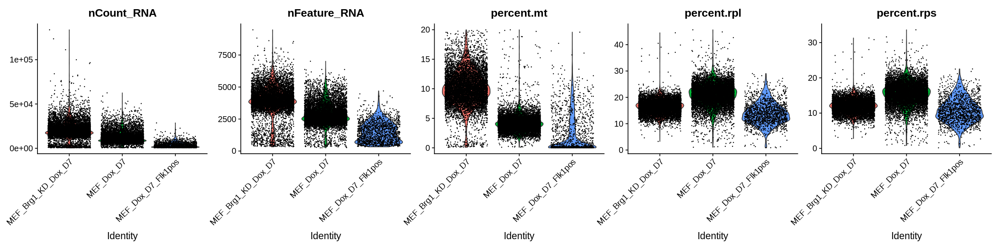

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 5)
VlnPlot(so_D7, c("nCount_RNA", "nFeature_RNA", 'percent.mt', 'percent.rpl', 'percent.rps'), pt.size = 0.1, ncol = 5)

### Cell cycle scoring analysis

In [ ]:
so_D7 <- CellCycleScoring(so_D7, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)
# view cell cycle scores and phase assignments
head(so_D7[[]])

Warning message:
“The following features are not present in the object: Mlf1ip, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Fam64a, Hn1, not searching for symbol synonyms”


,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rpl,percent.rps,S.Score,G2M.Score,Phase,old.ident
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
MEF_Dox_D7_AAACCTGAGTCACGCC-1,MEF_Dox_D7,8381,2565,3.543730,19.52034,14.67605,-0.05726267,-0.037863419,G1,MEF_Dox_D7
MEF_Dox_D7_AAACCTGCATCAGTCA-1,MEF_Dox_D7,17250,3820,4.649275,21.53043,15.18841,-0.03794752,0.009288020,G2M,MEF_Dox_D7
MEF_Dox_D7_AAACCTGCATTGGTAC-1,MEF_Dox_D7,37384,4998,1.915258,24.05307,17.36572,0.14757195,0.406660370,G2M,MEF_Dox_D7
MEF_Dox_D7_AAACCTGGTAGCCTCG-1,MEF_Dox_D7,8498,2281,3.847964,22.11108,17.49823,-0.05133297,-0.002310102,G1,MEF_Dox_D7
MEF_Dox_D7_AAACCTGGTCTTCGTC-1,MEF_Dox_D7,8328,2459,3.866475,17.08694,13.49664,-0.07320588,-0.063073797,G1,MEF_Dox_D7
MEF_Dox_D7_AAACCTGGTTACGGAG-1,MEF_Dox_D7,23523,4363,3.137355,21.95723,17.02164,0.24201231,0.371310134,G2M,MEF_Dox_D7


In [ ]:
so_D7 <- RunPCA(so_D7, features = VariableFeatures(so_D7))

PC_ 1 
Positive:  Rpl23a, Rpl13a, Snhg6, Emp1, Pfn1, AC160336.1, Hmga2, Usp50, Pdap1, Smarca4 
	   Thy1, Myadm, Tpm4, Ankrd1, Lgals3, Rflnb, H19, Nptx1, Ccnd1, Hmgn5 
	   Mapk6, Ddx21, Smpd3, Dpysl3, Rbpj, Ldlr, Insig1, Tinagl1, Pclaf, Alyref 
Negative:  mt-Nd3, mt-Nd4l, Ldhb, mt-Co2, Ndufa13, Prdx2, Prdx4, mt-Nd2, mt-Nd5, Psmb5 
	   Etfb, Tspo, Gabarap, Ifi27, Atp5h, Aldh2, Fabp5, Dcxr, Mgmt, Rpl30 
	   Tmem176a, Gsta4, Ubb, H2afj, Ctsz, Emc2, mt-Nd4, Ndufa4, Ndufa5, Tmem176b 
PC_ 2 
Positive:  Pclaf, Top2a, Birc5, Hmgb2, Ube2c, Ccna2, Sgo1, Cdca3, Hist1h2ap, Prc1 
	   H2afz, Cenpm, Anln, Stmn1, Tpx2, Tk1, Hells, Cenpf, Pimreg, Smc2 
	   Spc24, Tuba1b, Nusap1, Hmmr, Cenpa, Ccnb2, Racgap1, Cenpe, Kif23, Cks2 
Negative:  Ptn, Selenop, Ebf2, Mest, Thbs1, Smpd3, Mmp2, Gpm6b, Neat1, Plscr2 
	   Plagl1, Slc16a2, Mgp, Gas1, Smoc2, Atp1b1, Cyp1b1, Rflnb, Tgfbi, Grb10 
	   H19, Sfrp1, Rgs2, Nrep, Slfn5, Adamts5, Slco2a1, Akap12, Pdk4, Fbn2 
PC_ 3 
Positive:  Glud1, Gng11, Ctla2a, Kdr, Cd81, Hm

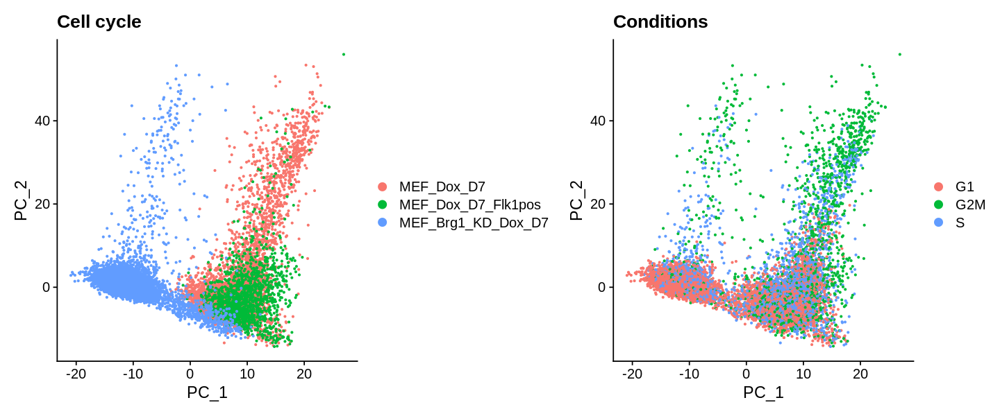

In [ ]:
options(repr.plot.width = 12, repr.plot.height = 5)
Idents(so_D7) <- 'orig.ident'
p1 <- DimPlot(so_D7, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Cell cycle")
Idents(so_D7) <- 'Phase'
p2 <- DimPlot(so_D7, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Conditions")
p1 + p2

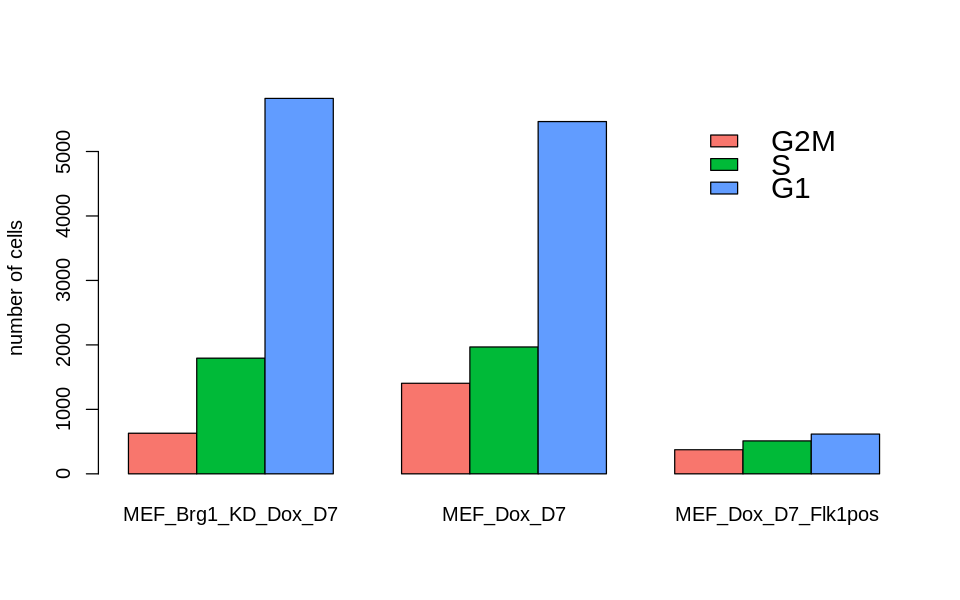

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 5)
table(so_D7[[]][, 'orig.ident'], factor(so_D7[[]][, 'Phase'], c('G2M', 'S', 'G1'))) %>% 
  t() %>%
  barplot(beside = TRUE, col = hue_pal()(3), ylab = 'number of cells')
legend('topright', c('G2M', 'S', 'G1'), fill = hue_pal()(3), bty = 'n', cex = 1.5, inset = 0.05)

### Regress out the confounding effects

In [ ]:
so_D7 <- ScaleData(object = so_D7, vars.to.regress = c('nCount_RNA', "nFeature_RNA", 'percent.mt', 'percent.rpl', 'percent.rps', "S.Score", "G2M.Score"))

Regressing out nCount_RNA, nFeature_RNA, percent.mt, percent.rpl, percent.rps, S.Score, G2M.Score

Centering and scaling data matrix



In [ ]:
so_D7 <- FindVariableFeatures(so_D7, selection.method = 'vst', nfeatures = 2000)
so_D7 <- RunPCA(so_D7, features = VariableFeatures(so_D7))

PC_ 1 
Positive:  Rpl23a, Hmga2, Rpl13a, Ankrd1, Emp1, Snhg6, AC160336.1, Pdap1, Dpysl3, Mapk6 
	   Dkk2, Thy1, Hbegf, Ccnd1, Ddx21, Rbpj, Ahnak, Cd44, Lgals3, Tnfrsf12a 
	   Fosl1, Arhgap22, Tinagl1, Nmt2, Nptx1, Axl, Etv4, Areg, Wincr1, Cdk6 
Negative:  Ubb, Ndufa13, Prdx2, Ldhb, Prdx4, Ifitm2, Ndufa4, Ifitm3, Etfb, Gabarap 
	   Gsta4, Ifi27, Atp5h, Uqcrb, Psmb5, Atpif1, Ndufa5, Emc2, Myl6, Maged2 
	   Rpl30, Fabp5, Ckb, Aldh2, Eef1d, Tmem176b, Tmem176a, Cxcl12, Lxn, 2410015M20Rik 
PC_ 2 
Positive:  Gas1, Cdh11, Thbs1, Ptn, Meg3, Sfrp1, Cyp1b1, Adamts5, Slc1a3, Col1a1 
	   Cxcl12, mt-Co1, Lox, Mest, Mmp2, Rnd3, Smpd3, Rspo2, Mgp, mt-Co3 
	   Adam23, Npr3, Grb10, Neat1, Peg3, H19, Ogn, Ebf2, Itga11, mt-Nd4 
Negative:  Gng11, Cd81, Nme1, Ctla2a, Glud1, Clic1, Dbi, Lgals3, Nrp2, Tspo 
	   Gchfr, Nptx1, Ctsl, Uqcrb, Hmgb3, Ubb, Slc25a5, Ndufa4, Ran, Egfl7 
	   Cox5a, Calm1, Itga6, Fam212a, Hspa8, Gapdh, Hmgn5, Mif, S100a4, Tinagl1 
PC_ 3 
Positive:  Glud1, Rgs2, Selenop, Adgrf5, Plscr2, 

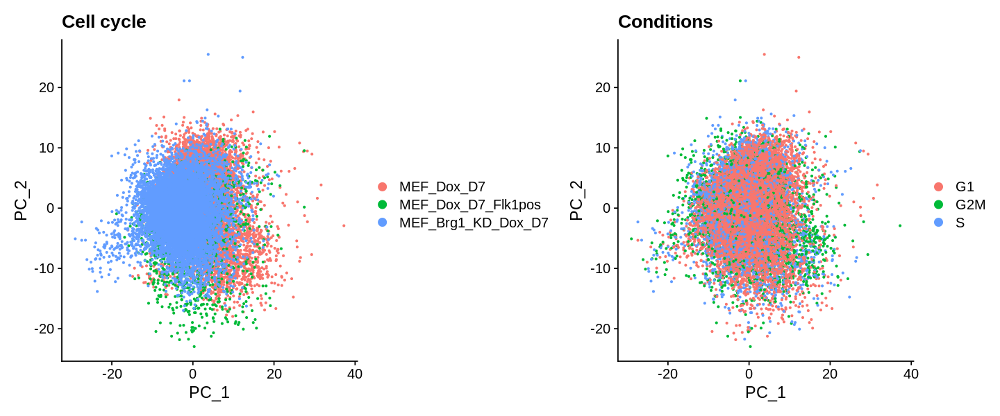

In [ ]:
options(repr.plot.width = 12, repr.plot.height = 5)
Idents(so_D7) <- 'orig.ident'
p1 <- DimPlot(so_D7, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Cell cycle")
Idents(so_D7) <- 'Phase'
p2 <- DimPlot(so_D7, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Conditions")
p1 + p2

### Dimension reduction

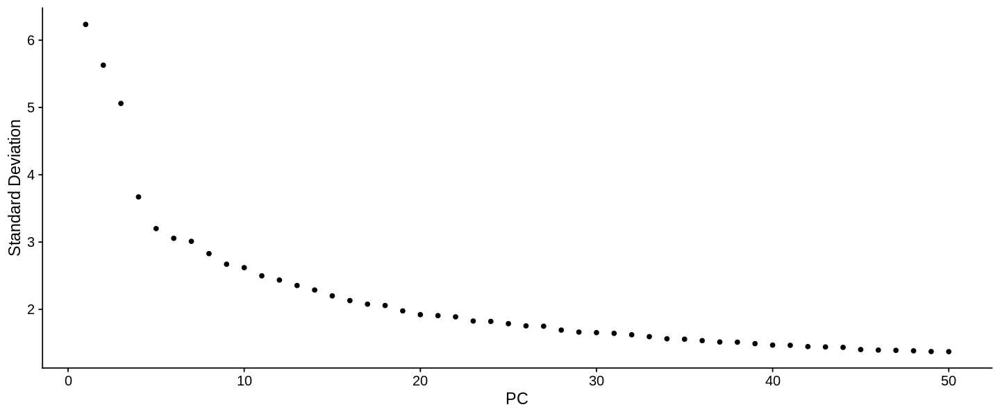

In [ ]:
ElbowPlot(so_D7, ndims = 50)

In [ ]:
so_D7 <- RunUMAP(so_D7, reduction = 'pca', dims = 1:50, min.dist = 0.75, verbose = FALSE)

In [ ]:
# Leiden clustering
so_D7 <- FindNeighbors(so_D7, reduction = 'umap', dims = 1:2)
so_D7 <- FindClusters(so_D7, algorithm = 1, resolution = 0.15)
# store the current identities in a new column of meta.data called cluster
so_D7$cluster <- Idents(so_D7)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 18588
Number of edges: 417144

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9660
Number of communities: 15
Elapsed time: 0 seconds


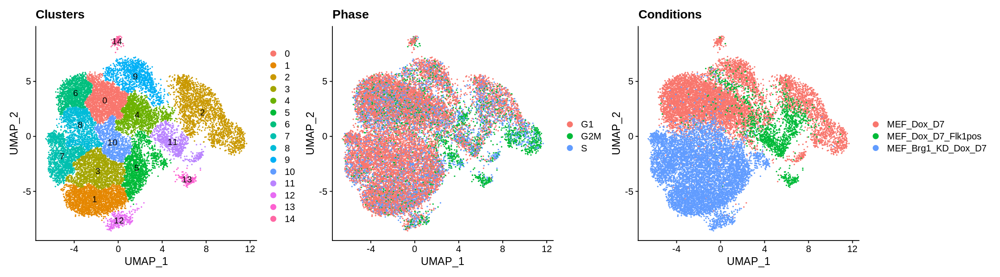

In [ ]:
library(ggplot2)
options(repr.plot.width = 18, repr.plot.height = 5)
Idents(so_D7) <- 'cluster'
p1 <- DimPlot(so_D7, reduction = "umap", pt.size = 0.25, label = TRUE) + ggtitle(label = "Clusters")
Idents(so_D7) <- 'Phase'
p2 <- DimPlot(so_D7, reduction = "umap", pt.size = 0.25) + ggtitle(label = "Phase")
Idents(so_D7) <- 'orig.ident'
p3 <- DimPlot(so_D7, reduction = "umap", pt.size = 0.25) + ggtitle(label = "Conditions")
p1 + p2 + p3

In [ ]:
genes <- c('Etv2', 'Kdr', 'Emcn', 'Lmo2', 'Cdh5', 'Sox18', 'Smarca4', 'Fosl1', 'Gata2', 'Gata1')

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Gata1”


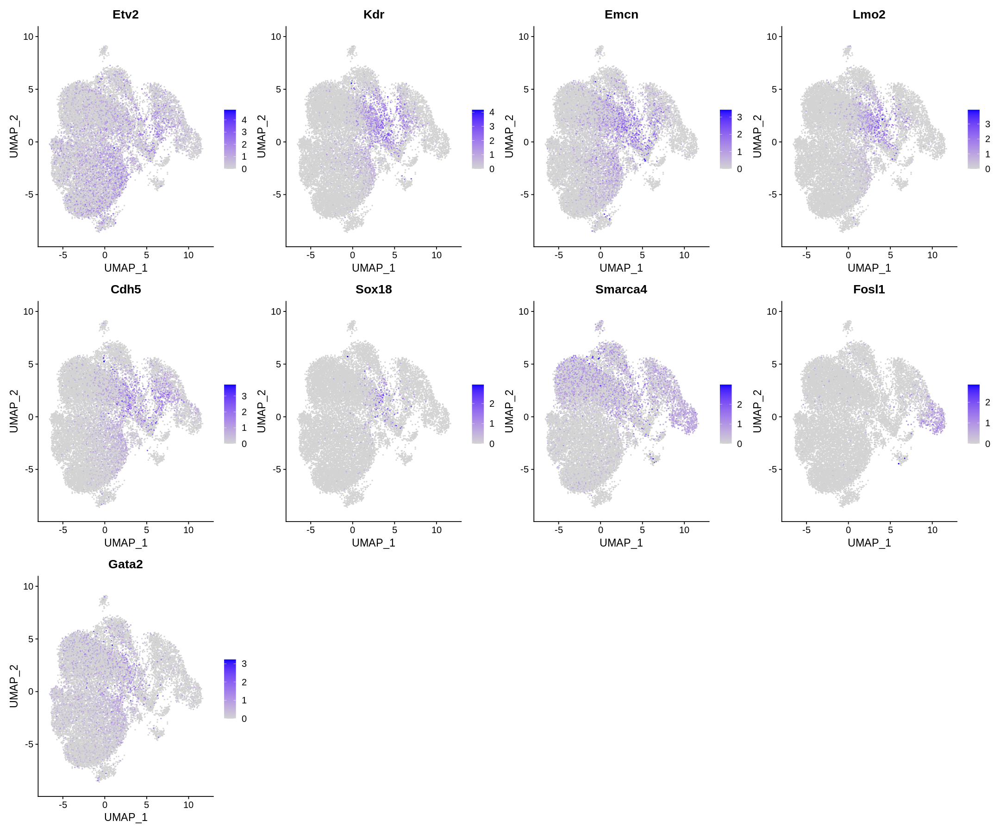

In [ ]:
options(repr.plot.width = 18, repr.plot.height = 15)
FeaturePlot(so_D7, dims = c(1, 2), features = genes, pt.size = 0.25, cols = c('lightgrey', 'blue'), ncol = 4)

### Identify cluster-speicifc genes

In [ ]:
Idents(so_D7) <- 'cluster'
so_markers <- FindAllMarkers(so_D7, test.use = "wilcox",, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14



In [ ]:
so_markers %>%
  group_by(cluster) %>% 
  top_n(n = 20, wt = avg_logFC) %>%
  print(n = 10000)

# A tibble: 295 x 7
# Groups:   cluster [15]
        p_val avg_logFC pct.1 pct.2 p_val_adj cluster gene     
        <dbl>     <dbl> <dbl> <dbl>     <dbl> <fct>   <chr>    
  1 0.            0.988 0.587 0.239 0.        0       H19      
  2 0.            0.772 0.999 0.975 0.        0       Malat1   
  3 0.            0.708 0.737 0.405 0.        0       Smpd3    
  4 0.            0.611 0.874 0.701 0.        0       Nr2f1    
  5 0.            0.610 0.816 0.482 0.        0       Ebf2     
  6 0.            0.446 0.997 0.987 0.        0       Rpl31    
  7 0.            0.427 0.997 0.998 0.        0       Rps27    
  8 5.01e-299     0.598 0.936 0.831 9.00e-295 0       Neat1    
  9 7.48e-292     0.631 0.854 0.597 1.35e-287 0       Thbs1    
 10 2.34e-282     0.510 0.893 0.772 4.21e-278 0       Cavin1   
 11 4.40e-247     0.417 0.937 0.705 7.92e-243 0       Rps27rt  
 12 3.19e-237     0.427 0.911 0.811 5.73e-233 0       Pbx1     
 13 1.58e-218     0.439 0.707 0.478 2.84e-214 0       Slc6a

In [ ]:
sessionInfo()

R version 4.0.2 (2020-06-22)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 18.04.5 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/openblas/libblas.so.3
LAPACK: /usr/lib/x86_64-linux-gnu/libopenblasp-r0.2.20.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
 [1] parallel  stats4    tools     stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] scales_1.1.1                farver_2.0.3               
 [3] forcats_0.5.0               stringr_1.4.0              
 [5] dplyr_1.0.2                 purrr_0.3.4                
 [7] readr_1.3.1                 tidyr_1.1.2       

In [ ]:
Sys.time() - start_time0

Time difference of 1.03807 hours

In [ ]:
## sessionInfo

In [ ]:
sessionInfo()

R version 4.0.2 (2020-06-22)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 18.04.5 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/openblas/libblas.so.3
LAPACK: /usr/lib/x86_64-linux-gnu/libopenblasp-r0.2.20.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
 [1] parallel  stats4    tools     stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] scales_1.1.1                farver_2.0.3               
 [3] forcats_0.5.0               stringr_1.4.0              
 [5] dplyr_1.0.2                 purrr_0.3.4                
 [7] readr_1.3.1                 tidyr_1.1.2       